In [1]:
import pandas as pd
df = pd.read_csv(filepath_or_buffer='/kaggle/input/full-tmdb-tv-shows-dataset-2023-150k-shows/TMDB_tv_dataset_v3.csv', index_col=['id'],
                parse_dates=['first_air_date', 'last_air_date'])
df['year_began'] = df['first_air_date'].apply(lambda x: x if isinstance(x, float) else int(x.split('-')[0]))
df['vote_average_int'] = df['vote_average'].apply(func=round)
df.head()

,name,number_of_seasons,number_of_episodes,original_language,vote_count,vote_average,overview,adult,backdrop_path,first_air_date,...,created_by,languages,networks,origin_country,spoken_languages,production_companies,production_countries,episode_run_time,year_began,vote_average_int
id,,,,,,,,,,,,,,,,,,,,,
1399,Game of Thrones,8,73,en,21857,8.442,Seven noble families fight for control of the ...,False,/2OMB0ynKlyIenMJWI2Dy9IWT4c.jpg,2011-04-17,...,"David Benioff, D.B. Weiss",en,HBO,US,English,"Revolution Sun Studios, Television 360, Genera...","United Kingdom, United States of America",0,2011,8
71446,Money Heist,3,41,es,17836,8.257,"To carry out the biggest heist in history, a m...",False,/gFZriCkpJYsApPZEF3jhxL4yLzG.jpg,2017-05-02,...,Álex Pina,es,"Netflix, Antena 3",ES,Español,Vancouver Media,Spain,70,2017,8
66732,Stranger Things,4,34,en,16161,8.624,"When a young boy vanishes, a small town uncove...",False,/2MaumbgBlW1NoPo3ZJO38A6v7OS.jpg,2016-07-15,...,"Matt Duffer, Ross Duffer",en,Netflix,US,English,"21 Laps Entertainment, Monkey Massacre Product...",United States of America,0,2016,9
1402,The Walking Dead,11,177,en,15432,8.121,Sheriff's deputy Rick Grimes awakens from a co...,False,/x4salpjB11umlUOltfNvSSrjSXm.jpg,2010-10-31,...,Frank Darabont,en,AMC,US,English,"AMC Studios, Circle of Confusion, Valhalla Mot...",United States of America,42,2010,8
63174,Lucifer,6,93,en,13870,8.486,"Bored and unhappy as the Lord of Hell, Lucifer...",False,/aDBRtunw49UF4XmqfyNuD9nlYIu.jpg,2016-01-25,...,Tom Kapinos,en,"FOX, Netflix",US,English,"Warner Bros. Television, DC Entertainment, Jer...",United States of America,45,2016,8


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 158566 entries, 1399 to 38212
Data columns (total 30 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   name                  158566 non-null  object 
 1   number_of_seasons     158566 non-null  int64  
 2   number_of_episodes    158566 non-null  int64  
 3   original_language     158566 non-null  object 
 4   vote_count            158566 non-null  int64  
 5   vote_average          158566 non-null  float64
 6   overview              158566 non-null  object 
 7   adult                 158566 non-null  bool   
 8   backdrop_path         158566 non-null  object 
 9   first_air_date        158566 non-null  object 
 10  last_air_date         158566 non-null  object 
 11  homepage              158566 non-null  object 
 12  in_production         158566 non-null  bool   
 13  original_name         158566 non-null  object 
 14  popularity            158566 non-null  float64
 15  pos

In [3]:
df.nunique()

name                    149754
number_of_seasons           82
number_of_episodes         967
original_language          106
vote_count                1110
vote_average              2603
overview                 88947
adult                        2
backdrop_path            74158
first_air_date           18026
last_air_date            18398
homepage                 48742
in_production                2
original_name           151501
popularity               20054
poster_path             102122
type                         7
status                       6
tagline                   5191
genres                    2210
created_by               25349
languages                 1098
networks                  8037
origin_country             784
spoken_languages           936
production_companies     26425
production_countries      1226
episode_run_time           424
year_began                  91
vote_average_int            11
dtype: int64

In [4]:
from plotly.express import bar
for column in ['number_of_seasons', 'adult', 'in_production', 'type', 'status', ]:
    log_y = column == 'number_of_seasons'
    bar(data_frame=df[column].value_counts().to_frame().reset_index(), x=column, y='count', log_y=log_y).show()

In [5]:
from plotly.express import histogram
histogram(data_frame=df[df['year_began'] > 1500].sort_values(by='vote_average_int'), color='vote_average_int', log_y=True, x='year_began')

In [6]:
histogram(data_frame=df[(df['year_began'] > 1500) & (df['vote_average_int'] > 0)].sort_values(by='vote_average_int'), color='vote_average_int', log_y=True, x='year_began')

Our dataset has 1500 for unknown, apparently. And the bulk of our dataset has no votes at all.

In [7]:
from plotly.express import scatter
scatter(data_frame=df[df['vote_average'] > 0], x='number_of_seasons', y='number_of_episodes', color='vote_average', hover_name='name', log_x=True, log_y=True)

In [8]:
scatter(data_frame=df[df['vote_average_int'] == 10], x='number_of_seasons', y='number_of_episodes', color='vote_average', 
        hover_name='name', log_x=True, log_y=True, color_continuous_scale='bluered_r')

If we just look at the top-rated shows we still have a nontrivial dataset. Shout out to high-rated shows with multiple seasons and only one episode.

In [9]:
for color in ['adult', 'in_production', 'type', 'status', ]:
    scatter(data_frame=df[df['vote_average'] > 0], x='number_of_seasons', y='number_of_episodes', color=color, hover_name='name',
            log_x=True, log_y=True).show()

We have free text so we must make word clouds.

(-0.5, 1199.5, 1199.5, -0.5)

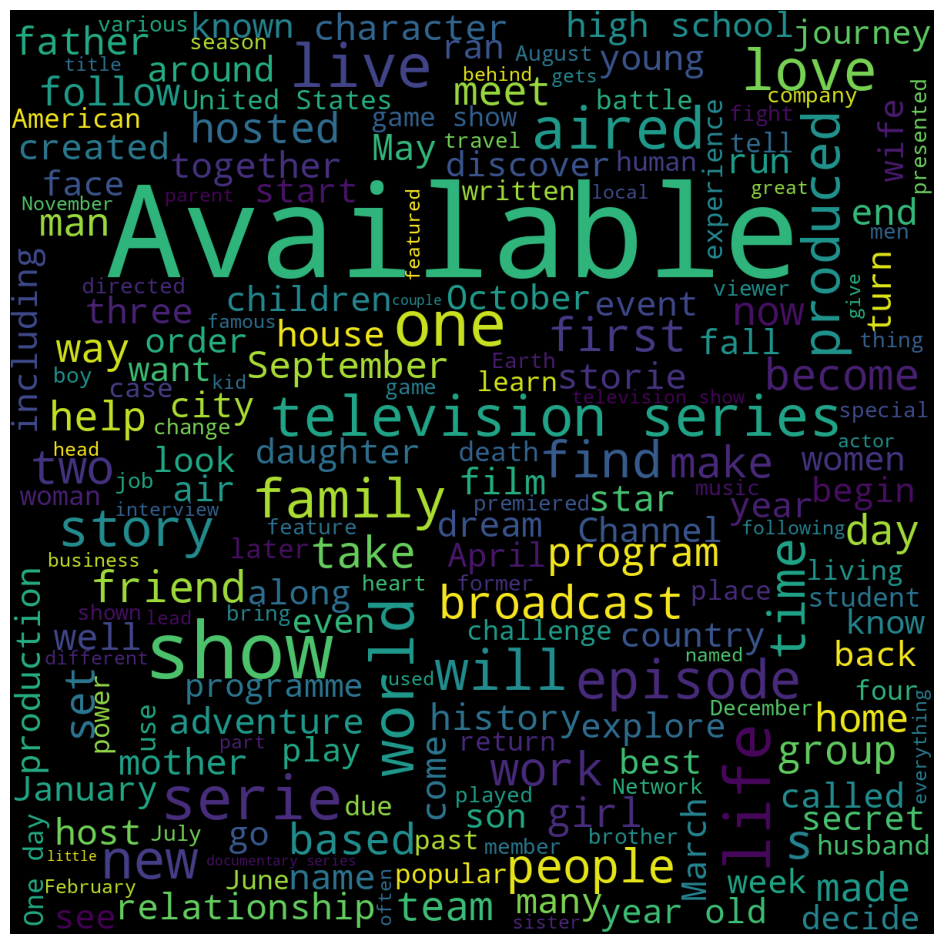

In [10]:
from matplotlib.pyplot import subplots
from matplotlib.pyplot import axis
from matplotlib.pyplot import imshow
from wordcloud import WordCloud
subplots(figsize=(12, 12))
imshow(X=WordCloud(random_state=2023, height=1200, width=1200 ).generate(text=' '.join(df['overview'].values.tolist())), )
axis('off')

(-0.5, 1199.5, 1199.5, -0.5)

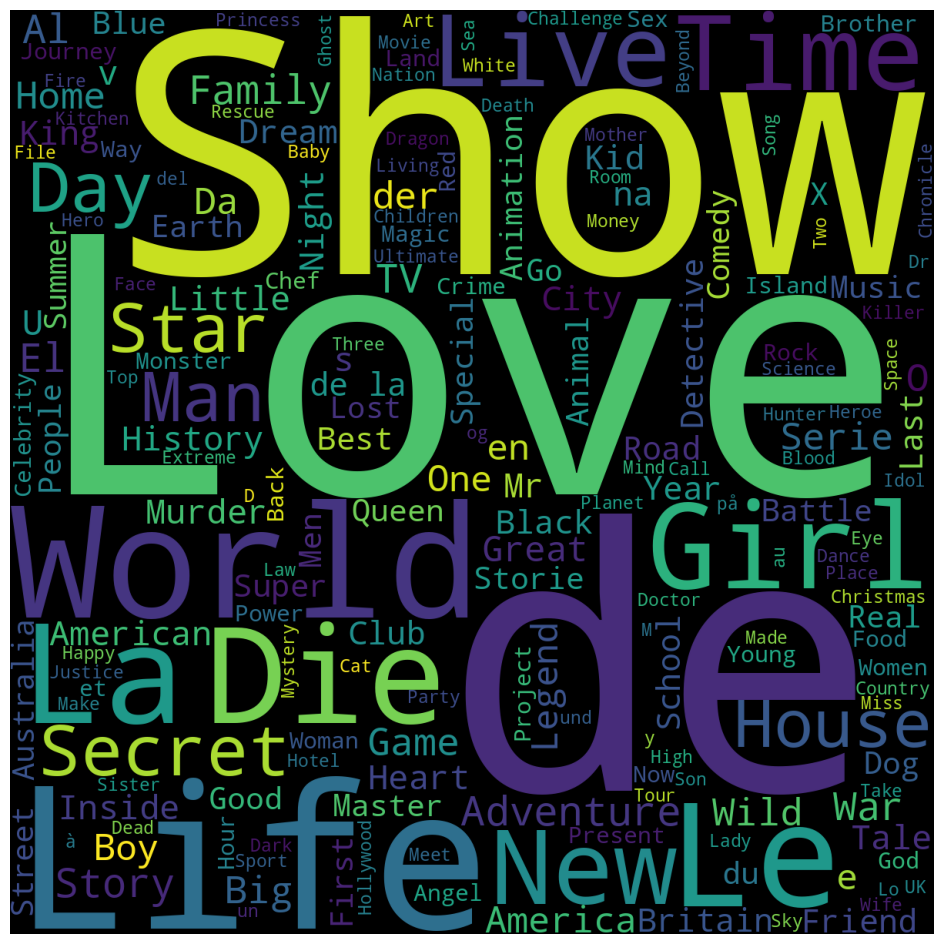

In [11]:
subplots(figsize=(12, 12))
imshow(X=WordCloud(random_state=2023, height=1200, width=1200 ).generate(text=' '.join(df['name'].values.tolist())), )
axis('off')

We only have English stopwords and our corpus includes some non-English shows, so we see some non-English tokens here.

(-0.5, 1199.5, 1199.5, -0.5)

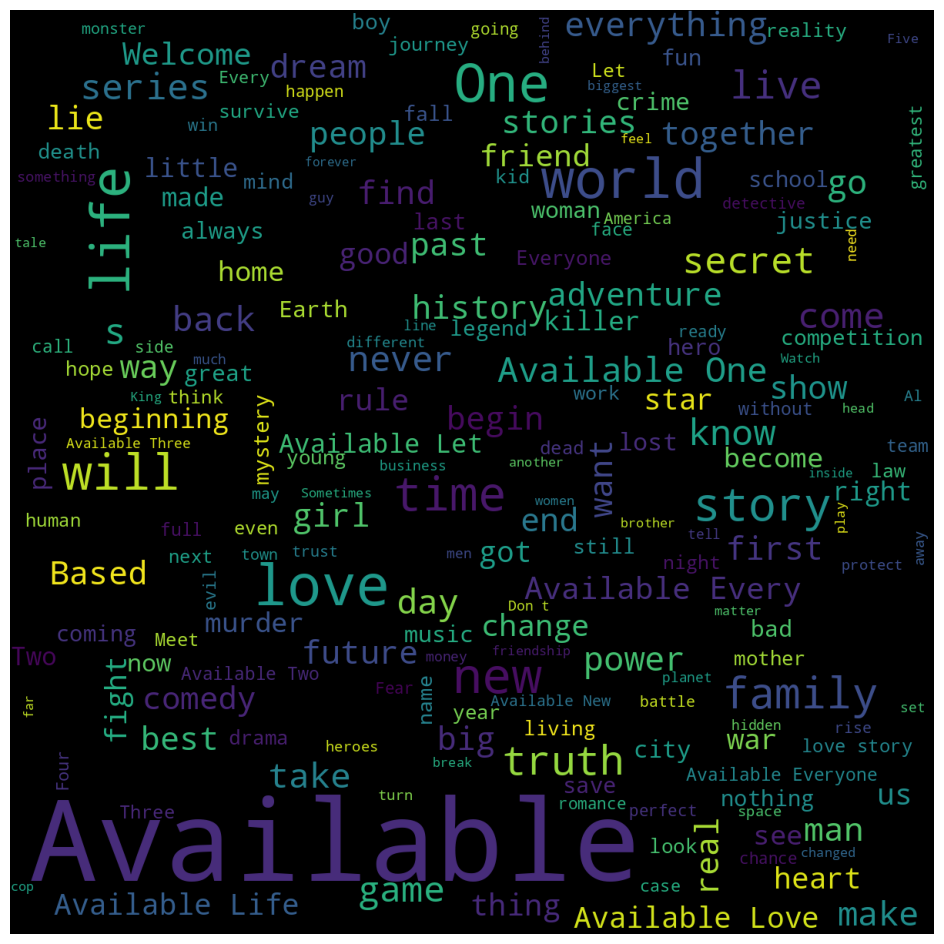

In [12]:
subplots(figsize=(12, 12))
imshow(X=WordCloud(random_state=2023, height=1200, width=1200 ).generate(text=' '.join(df['tagline'].values.tolist())), )
axis('off')